** 1. What is Logistic Regression?**

Logistic Regression is a supervised machine learning algorithm used for binary classification problems – where the output is either 0 or 1 (e.g., Yes/No, Spam/Not Spam, Disease/No Disease).

Despite the name, it is not a regression algorithm (like Linear Regression); it is used for classification.

Example:

Given features like age, weight, blood pressure, etc., we want to predict the probability of a patient having a disease (1) or not (0).


It uses the logistic (sigmoid) function to model probabilities.

➤ Step-by-step:
Compute a linear combination of the input features:

𝑧
=
𝑤
1
𝑥
1
+
𝑤
2
𝑥
2
+
⋯
+
𝑤
𝑛
𝑥
𝑛
+
𝑏
z=w
1
​
 x
1
​
 +w
2
​
 x
2
​
 +⋯+w
n
​
 x
n
​
 +b
where
𝑤
w are weights,
𝑥
x are features, and
𝑏
b is the bias.

Pass this value through a sigmoid function:

𝜎
(
𝑧
)
=
1
1
+
𝑒
−
𝑧
σ(z)=
1+e
−z

1
​

This compresses any real value into the range (0, 1), so we can interpret it as a probability.



- Familiarize yourself with logistic regression algorithms.

**Types of Logistic Regression Algorithms**
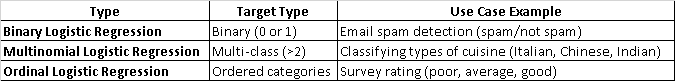

Logistic regression uses:

Sigmoid function for binary classification:

𝜎
(
𝑧
)
=
1
1
+
𝑒
−
𝑧
σ(z)=
1+e
−z

1
​

Softmax function for multi-class classification:

𝑃
(
𝑦
=
𝑗
∣
𝑥
)
=
𝑒
𝑧
𝑗
∑
𝑘
=
1
𝐾
𝑒
𝑧
𝑘
P(y=j∣x)=
∑
k=1
K
​
 e
z
k
​


e
z
j
​


​

Where
𝑧
𝑗
=
𝑤
𝑗
𝑇
𝑥
+
𝑏
𝑗
z
j
​
 =w
j
T
​
 x+b
j
​


- Recognize different evaluation metrics for logistic regression and their importance.


1. Accuracy
Definition: The ratio of the number of correct predictions to the total number of predictions.

Formula:

Accuracy=  TP+TN /TP+TN+FP+FN
​

where:

TP = True Positive (correct positive prediction)

TN = True Negative (correct negative prediction)

FP = False Positive (incorrect positive prediction)

FN = False Negative (incorrect negative prediction)

Importance: Accuracy is a simple metric to evaluate the performance of the classifier. However, it can be misleading in imbalanced datasets (where one class is much more frequent than the other). In such cases, a high accuracy could be achieved by simply predicting the majority class.

2. Precision
Definition: The proportion of positive predictions that are actually correct.

Formula:

Precision= TP /TP+FP
​

Importance: Precision is important when the cost of false positives is high. For example, in email spam classification, false positives (legitimate emails marked as spam) can be costly.

3. Recall (Sensitivity or True Positive Rate)
Definition: The proportion of actual positives that were correctly identified by the model.

Formula:

Recall= TP /TP+FN


​

Importance: Recall is crucial when the cost of false negatives is high. For instance, in medical diagnosis (e.g., cancer detection), we want to minimize false negatives to ensure that all possible cases are identified, even if some false positives occur.

4. F1-Score
Definition: The harmonic mean of Precision and Recall. It provides a balance between the two.

Formula:

F1=2× Precision×Recall/ Precision+Recall


​

Importance: The F1-Score is especially useful when dealing with imbalanced datasets. It helps in situations where both false positives and false negatives are important, and neither should be neglected.

5. ROC-AUC (Receiver Operating Characteristic - Area Under the Curve)
Definition: A plot of the True Positive Rate (Recall) against the False Positive Rate at various threshold settings. The AUC is the area under the ROC curve.

Formula: The AUC is computed by integrating the ROC curve. AUC ranges from 0 to 1, where 1 indicates a perfect model and 0.5 indicates a random model.

Importance: AUC is particularly useful for evaluating the classifier’s ability to discriminate between the positive and negative classes, regardless of the classification threshold. It is more informative than accuracy in imbalanced datasets.

6. Log-Loss (Logarithmic Loss or Cross-Entropy Loss)
Definition: Measures the performance of a classification model where the output is a probability value between 0 and 1.

Formula:
LogLoss= -1/N i=1∑N[yilog(pi)+(1−yi)log(1−pi)]

where:
yi  is the true label

pi  is the predicted probability of the positive class

N is the number of instances

Importance: Log-loss evaluates how close the predicted probabilities are to the actual labels. It is particularly useful when we care not just about whether the prediction is right or wrong, but also about the confidence of the model in its predictions.

7. Confusion Matrix
Definition: A table used to describe the performance of a classification model, particularly in binary classification problems. It displays the True Positives, True Negatives, False Positives, and False Negatives.

Importance: The confusion matrix provides a comprehensive view of how well the model is performing, allowing you to calculate multiple other evaluation metrics, such as accuracy, precision, recall, and F1-score.

Summary of Importance:
Accuracy: Useful for balanced datasets but misleading in imbalanced datasets.

Precision: Critical when false positives are costly.

Recall: Crucial when false negatives are costly.

F1-Score: Balances precision and recall, especially in imbalanced datasets.

ROC-AUC: Indicates model’s ability to discriminate between classes; useful for imbalanced datasets.

Log-Loss: Measures the quality of probability predictions.

Confusion Matrix: Provides a detailed performance breakdown.

These metrics help evaluate different aspects of model performance, making it essential to choose the right evaluation metric based on the problem at hand.

2. Data Exploration:

Analyze the dataset's structure and characteristics using various exploratory techniques
such as histograms, scatter plots, and correlation matrices.

In [3]:
# Importing important libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')

In [13]:
#loading dataset
df = pd.read_excel('Dry_Bean_Dataset.xlsx')
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
#finding duplicate
df.duplicated().sum()

np.int64(68)

In [4]:
df.drop_duplicates(inplace=True)

In [5]:
#checkng null values
df.isnull().any().sum()

np.int64(0)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13543 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13543 non-null  int64  
 1   Perimeter        13543 non-null  float64
 2   MajorAxisLength  13543 non-null  float64
 3   MinorAxisLength  13543 non-null  float64
 4   AspectRation     13543 non-null  float64
 5   Eccentricity     13543 non-null  float64
 6   ConvexArea       13543 non-null  int64  
 7   EquivDiameter    13543 non-null  float64
 8   Extent           13543 non-null  float64
 9   Solidity         13543 non-null  float64
 10  roundness        13543 non-null  float64
 11  Compactness      13543 non-null  float64
 12  ShapeFactor1     13543 non-null  float64
 13  ShapeFactor2     13543 non-null  float64
 14  ShapeFactor3     13543 non-null  float64
 15  ShapeFactor4     13543 non-null  float64
 16  Class            13543 non-null  object 
dtypes: float64(14), i

In [7]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000
mean,53048.460385,854.993406,319.895602,202.365321,1.581075,0.750315,53767.986709,253.034094,0.749829,0.987152,0.873671,0.800352,0.006561,0.001719,0.644341,0.995078
std,29392.438324,214.722684,85.809260,45.051632,0.245245,0.091858,29844.248525,59.307709,0.048939,0.004650,0.059393,0.061464,0.001130,0.000595,0.098653,0.004347
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36282.500000,703.230000,253.086806,175.886357,1.430662,0.715144,36673.000000,214.933277,0.718735,0.985678,0.833410,0.763228,0.005893,0.001158,0.582517,0.993720
50%,44580.000000,793.896000,296.404589,192.491117,1.549860,0.763997,45122.000000,238.245711,0.759903,0.988288,0.883490,0.801514,0.006643,0.001700,0.642424,0.996393
75%,61382.000000,977.146500,376.312489,217.245403,1.703916,0.809671,62360.000000,279.560351,0.786849,0.990019,0.917031,0.834470,0.007270,0.002173,0.696341,0.997891
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


'''
inference
for column Area,perimeter, majoraxislength ,convexarea and equivdiameter mean is greater than meadian. data is right skewed
for column water,Superplasticizer and streght mean and median are almost equal it is normalised
for column Coarse Aggregate and Fine Aggregate	mean is lesser than median. so data is left skewed
'''

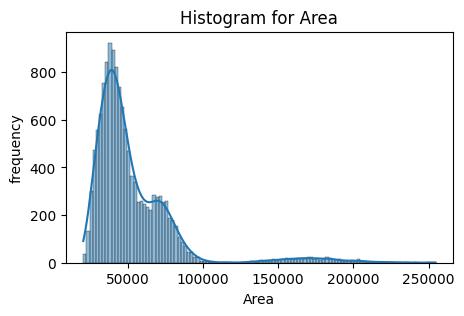

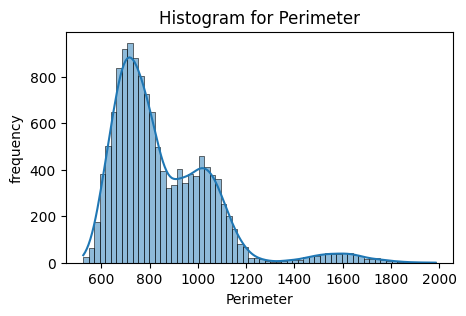

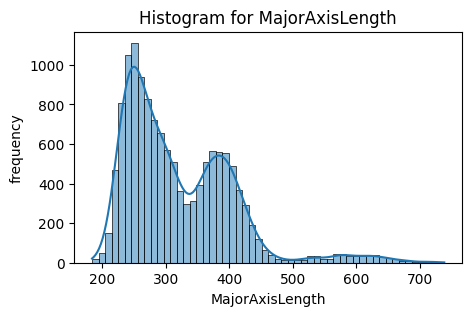

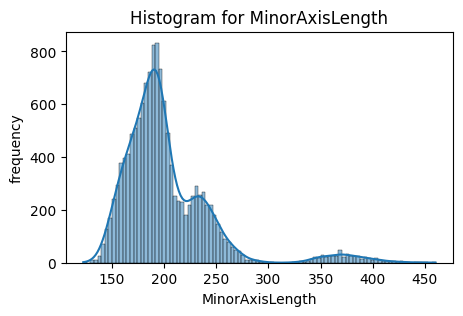

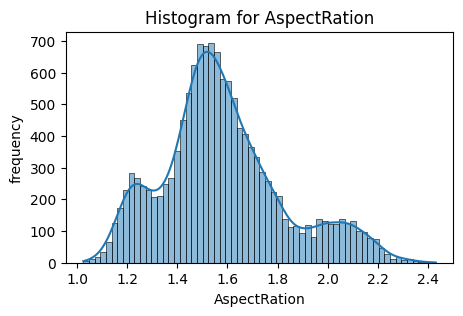

...

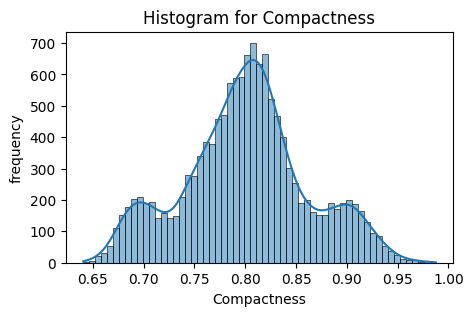

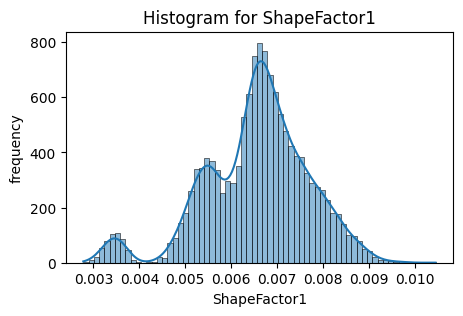

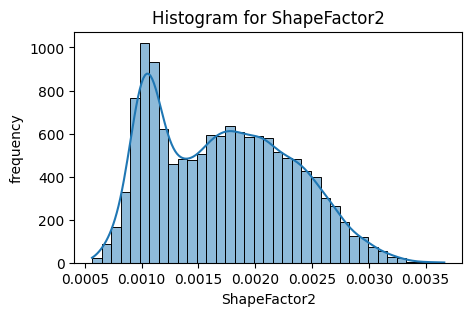

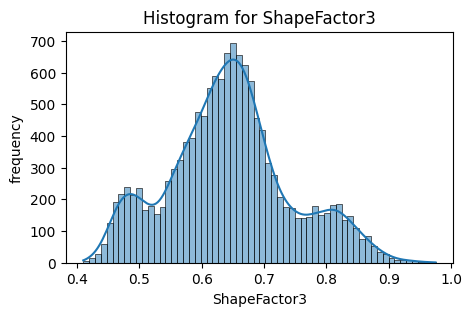

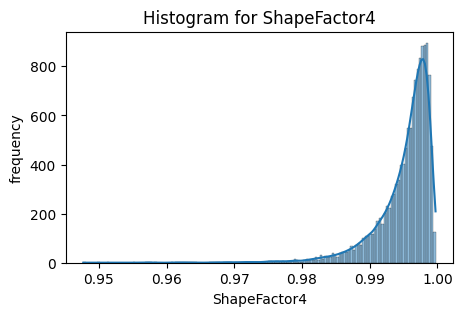

In [ ]:
#histogram for numeric value
for col in df.select_dtypes(include= np.number):
  plt.figure(figsize = (5,3))
  sns.histplot(df[col],kde = True)
  plt.title(f'Histogram for {col}')
  plt.xlabel(col)
  plt.ylabel('frequency')
  plt.show()

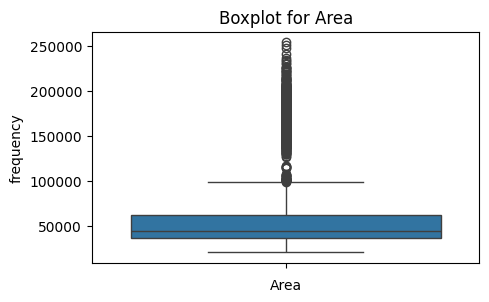

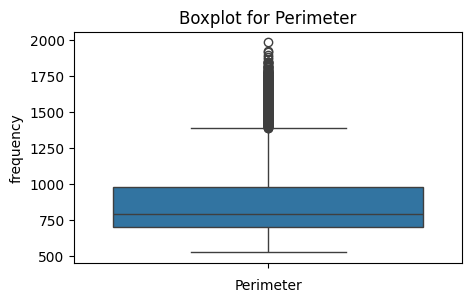

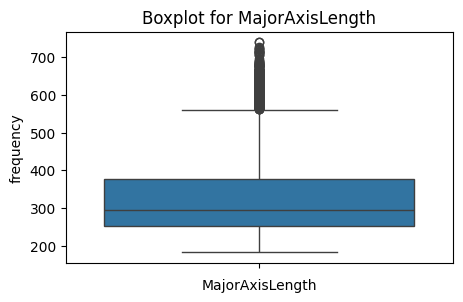

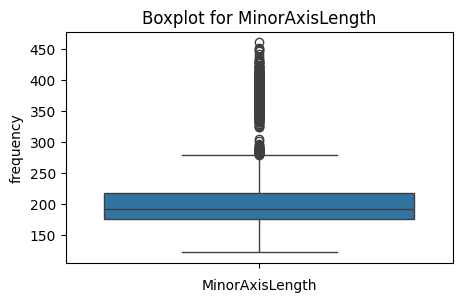

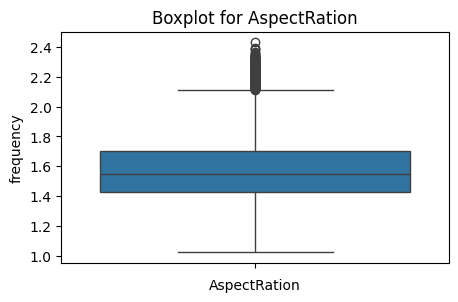

...

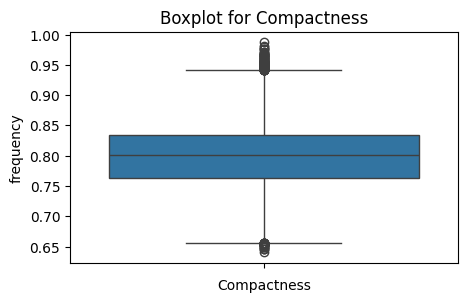

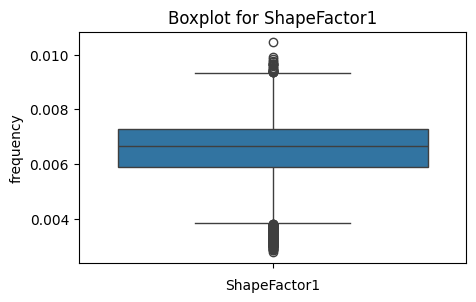

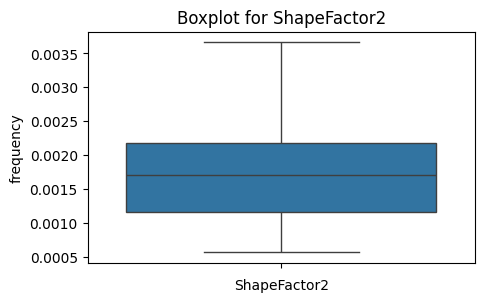

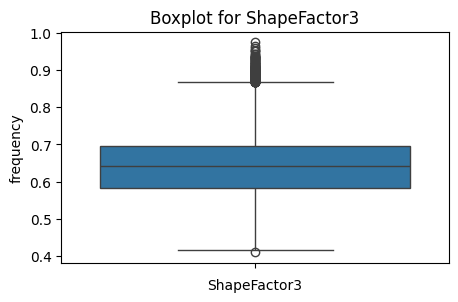

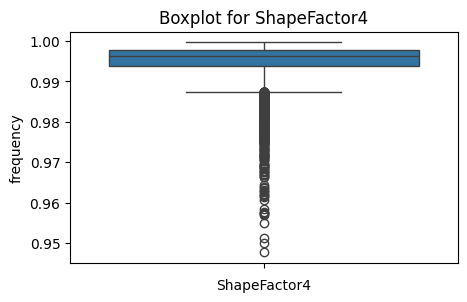

In [ ]:
#boxplot for numeric value
for col in df.select_dtypes(include= np.number):
  plt.figure(figsize = (5,3))
  sns.boxplot(df[col])
  plt.title(f'Boxplot for {col}')
  plt.xlabel(col)
  plt.ylabel('frequency')
  plt.show()

<Figure size 1000x600 with 0 Axes>

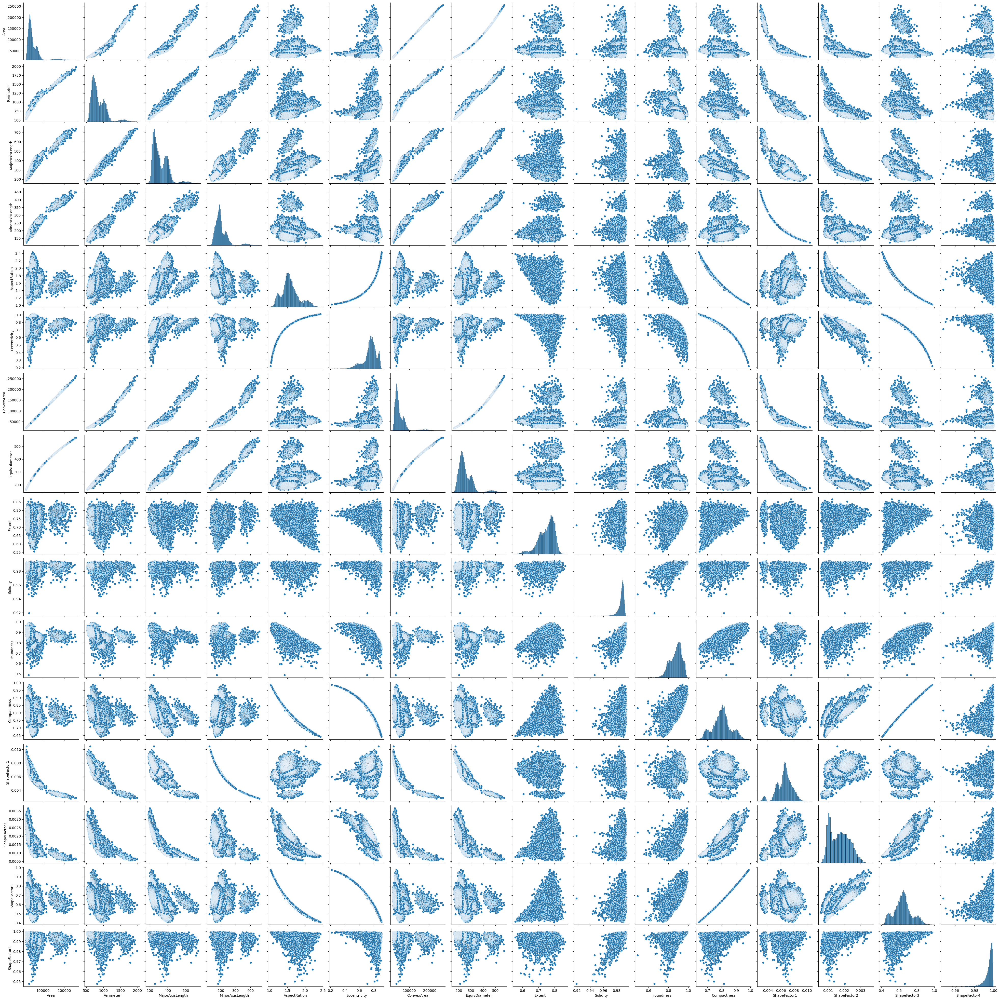

In [ ]:
plt.figure(figsize = (10, 6))
sns.pairplot(df)

In [8]:
df = df.dropna()

Non-numeric columns: Index(['Class'], dtype='object')


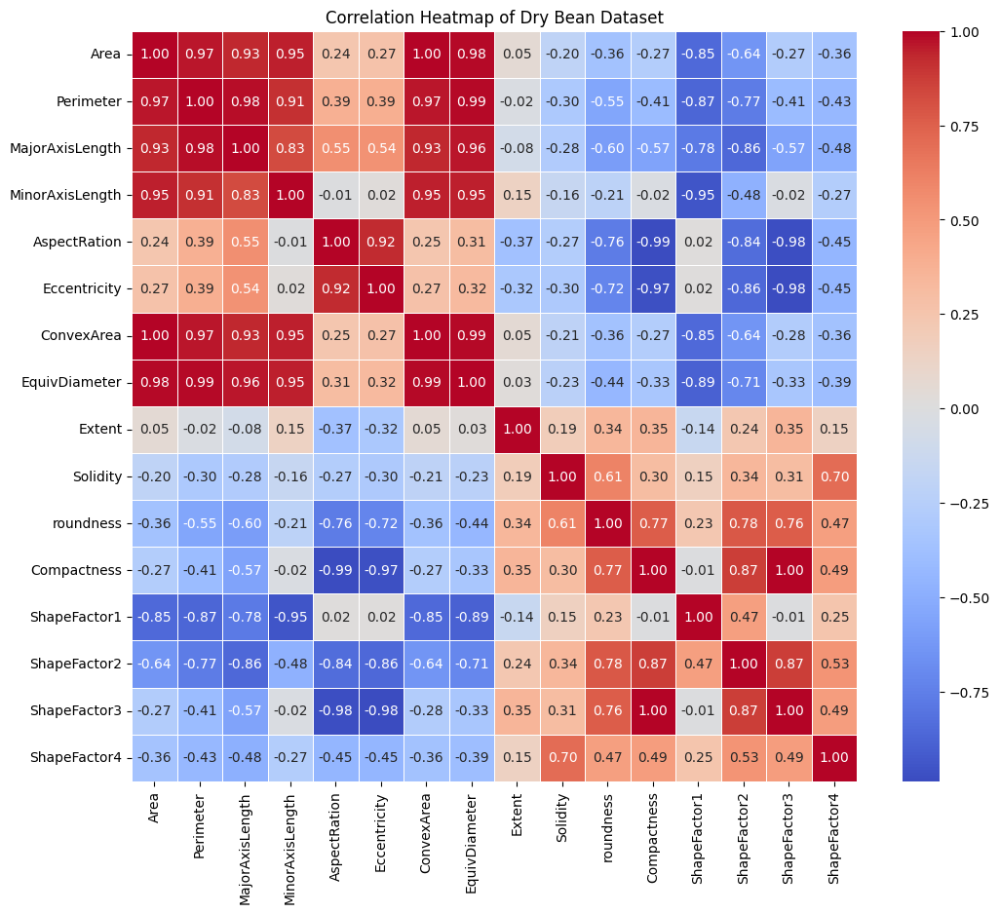

In [9]:

# Step 2: Identify columns with non-numeric values (if any)
non_numeric_columns = df.select_dtypes(exclude=[float, int]).columns
print("Non-numeric columns:", non_numeric_columns)

# Step 3: Handle non-numeric columns
# Option 1: Drop non-numeric columns if they are not needed for correlation
df = df.drop(columns=non_numeric_columns)

# Option 2: Alternatively, you can convert categorical columns to numeric (e.g., using label encoding)
# For example:
# df['categorical_column'] = df['categorical_column'].astype('category').cat.codes

# Step 4: Handle missing values if any
df = df.dropna()  # Drop rows with missing values

# Step 5: Calculate the correlation matrix
correlation_matrix = df.corr()

# Step 6: Generate the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Dry Bean Dataset')
plt.show()

In [12]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166


In [14]:
# X contains features and y contains the target variable
X = df.drop('Class', axis=1)  # Remove target column
y = df['Class']  # Target variable (class labels)

In [15]:
# Handle missing values (if any)
X = X.fillna(X.mean())  # Fill missing values with column mean (or use dropna())


In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# Step 4: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 5: Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [17]:
# Step 6: Train the Logistic Regression model
model = LogisticRegression(max_iter=1000)  # max_iter to ensure convergence
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [18]:
# Step 7: Make predictions
y_pred = model.predict(X_test)


Accuracy: 92.29%
Confusion Matrix:
[[360   0  22   0   0   2  11]
 [  0 161   0   0   0   0   0]
 [ 19   0 445   0   7   2   6]
 [  0   0   0 941   1  18  83]
 [  3   0   5   5 560   0  15]
 [  9   0   0   9   0 582  19]
 [  1   0   1  57  10  10 720]]
Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.91      0.91       395
      BOMBAY       1.00      1.00      1.00       161
        CALI       0.94      0.93      0.93       479
    DERMASON       0.93      0.90      0.92      1043
       HOROZ       0.97      0.95      0.96       588
       SEKER       0.95      0.94      0.94       619
        SIRA       0.84      0.90      0.87       799

    accuracy                           0.92      4084
   macro avg       0.94      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



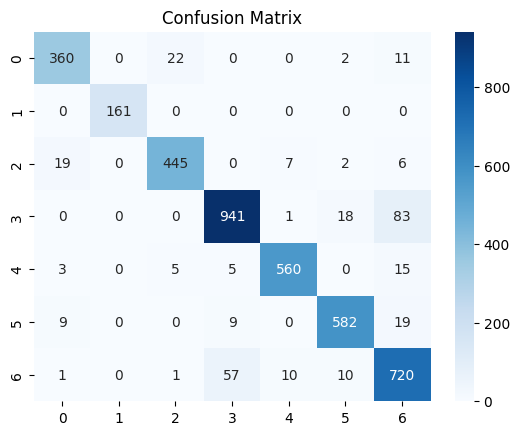

In [19]:
# Step 8: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Confusion Matrix
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))

# Classification Report (Precision, Recall, F1-Score)
print('Classification Report:')
print(classification_report(y_test, y_pred))

# Optional: Confusion Matrix Visualization
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

**3. Preprocessing and Feature Engineering:**
- Handle missing values and categorical variables appropriately.
- Encode categorical variables if necessary.

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler

#loading dataset
df = pd.read_excel('Dry_Bean_Dataset.xlsx')
df.head()

# Handle missing values

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
imputer = SimpleImputer(strategy='mean')
df[numerical_cols] = imputer.fit_transform(df[numerical_cols])

# Encode categorical variables
label_encoder = LabelEncoder()
df['Class'] = label_encoder.fit_transform(df['Class'])  # Label encode target variable

# One-Hot Encode other categorical columns (if any)
df = pd.get_dummies(df, columns=['Class'], drop_first=True)  # Replace with actual column name
df.head()
# Now you have preprocessed data ready for model training

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,...,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6
0,28395.0,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,...,0.007332,0.003147,0.834222,0.998724,False,False,False,False,True,False
1,28734.0,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,...,0.006979,0.003564,0.909851,0.998430,False,False,False,False,True,False
2,29380.0,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,...,0.007244,0.003048,0.825871,0.999066,False,False,False,False,True,False
3,30008.0,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,...,0.007017,0.003215,0.861794,0.994199,False,False,False,False,True,False
4,30140.0,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,...,0.006697,0.003665,0.941900,0.999166,False,False,False,False,True,False


In [20]:
# Feature scaling (standardization)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.drop('Class', axis=1))

**4. Logistic Regression Construction:**
- Choose appropriate hyperparameters such as regularization strength and solver.
- Implement Logistic Regression algorithms using chosen parameters.
- Train the Logistic Regression model on the training data.

In Logistic Regression, hyperparameters control the model's behavior and performance. Two important hyperparameters that often need tuning are:

Regularization Strength (C)

Solver

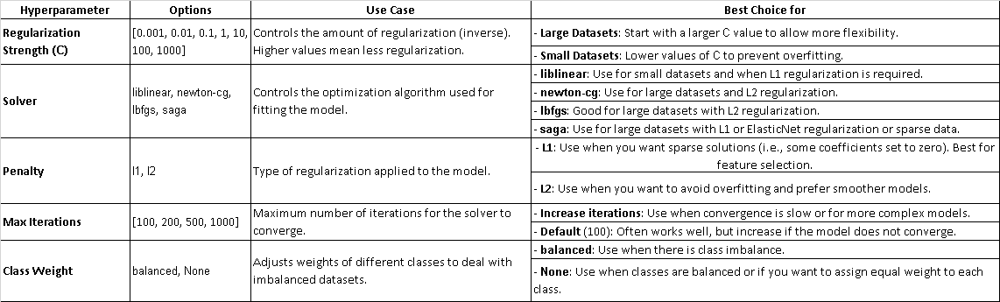

In [10]:
#loading dataset
df = pd.read_csv('new_test.csv')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,poutcome
0,32,4,0,6,0,0,0,0,3,3,131,5,1
1,37,10,3,6,0,0,0,0,4,3,100,1,1
2,55,5,0,5,1,2,0,0,3,2,131,2,1
3,44,2,1,0,1,0,0,1,4,3,48,2,1
4,28,0,2,3,0,0,0,0,5,0,144,2,1


In [11]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

# Assuming 'target' is the column to predict
X = df.drop('poutcome', axis=1)  # Features
y = df['poutcome']  # Target variable

# Preprocessing for numeric columns (handle missing and scale)
numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values
    ('scaler', StandardScaler())  # Standardize features
])

# Preprocessing for categorical columns (handle missing and encode)
categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Impute missing values
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encoding for categorical columns
])

# Combine both transformations in a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Create a pipeline with preprocessing and logistic regression
model = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', LogisticRegression(max_iter=1000))])

# Define the hyperparameter grid
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'classifier__solver': ['liblinear', 'newton-cg', 'lbfgs', 'saga'],  # Solvers to try
    'classifier__penalty': ['l1', 'l2']  # Penalties to try
}

# Perform GridSearchCV
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')  # 5-fold cross-validation
grid_search.fit(X_train, y_train)

# Print the best parameters and score
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Cross-Validation Accuracy: {:.2f}%".format(grid_search.best_score_ * 100))

# Evaluate on the test data
test_accuracy = grid_search.best_estimator_.score(X_test, y_test)
print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))


Best Hyperparameters:  {'classifier__C': 0.01, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
Best Cross-Validation Accuracy: 86.89%
Test Accuracy: 86.45%


**5. Model Evaluation:**
- Evaluate the trained model using appropriate metrics such as accuracy, precision, recall,
F1-score, and ROC-AUC.
- Visualize the logistic regression model to interpret the learned coefficients and feature
importance.

In [30]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

# Load the banking dataset (replace 'new_train.csv' with your actual dataset path)
df = pd.read_csv('new_train.csv')

# Preprocessing: Handle missing values and encode categorical variables
X = df.drop('poutcome', axis=1)  # Features
y = df['poutcome']  # Target variable

# Preprocessing for numeric columns (handling missing values and scaling)
numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values
    ('scaler', StandardScaler())  # Standardize features
])

# Preprocessing for categorical columns (handle missing values and encode them)
categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Impute missing values
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encoding for categorical variables
])

# Combine both transformations into a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Logistic Regression Model with preprocessing pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', LogisticRegression(max_iter=1000, multi_class='ovr'))])
# Step: Calculate ROC-AUC score for multi-class classification (One-vs-Rest)
#roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class='ovr', average='macro')
# Train the model
model.fit(X_train, y_train)

# Step 3: Make predictions
y_pred = model.predict(X_test)
y_pred_prob = model.predict_proba(X_test)  # Probability estimates for ROC-AUC

# Step 4: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred,average = 'weighted')
recall = recall_score(y_test, y_pred,average = 'weighted')
f1 = f1_score(y_test, y_pred,average = 'weighted')
roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class='ovr', average='weighted')


# Print evaluation metrics
print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'Precision: {precision * 100:.2f}%')
print(f'Recall: {recall * 100:.2f}%')
print(f'F1-Score: {f1 * 100:.2f}%')
print(f'ROC-AUC: {roc_auc:.2f}')

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

Accuracy: 99.47%
Precision: 99.48%
Recall: 99.47%
F1-Score: 99.48%
ROC-AUC: 1.00
Confusion Matrix:
[[1034    0   33]
 [   0 8456    0]
 [  19    0  343]]


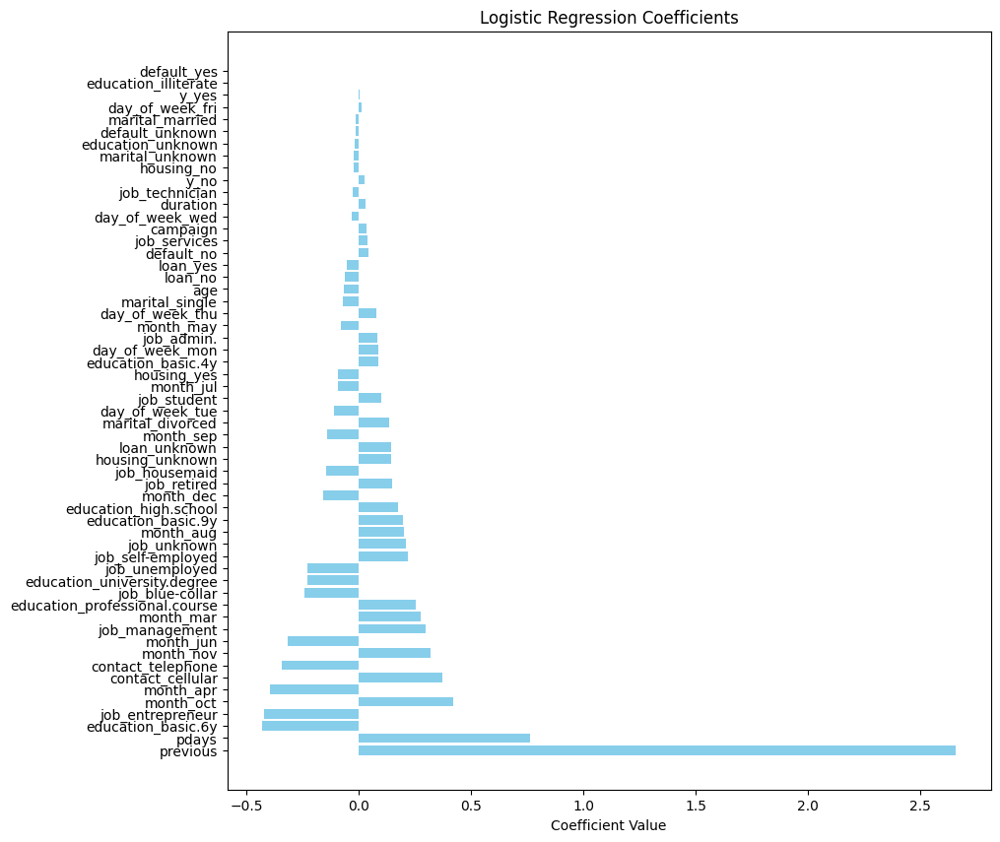

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

# Load the dataset (replace with your actual file)
df = pd.read_csv('new_train.csv')

# Split features and target variable
X = df.drop('poutcome', axis=1)
y = df['poutcome']

# Preprocessing for numeric columns (handle missing and scale)
numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical columns (handle missing and encode them)
categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformations into a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Logistic Regression model with preprocessing pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', LogisticRegression(max_iter=1000))])

# Train the model
model.fit(X_train, y_train)

# Access the Logistic Regression model from the pipeline
classifier = model.named_steps['classifier']

# Access the preprocessor (ColumnTransformer) from the pipeline
preprocessor = model.named_steps['preprocessor']

# Access the OneHotEncoder inside the preprocessor
one_hot_encoder = preprocessor.transformers_[1][1].named_steps['onehot']

# Get the feature names after one-hot encoding (important for categorical features)
one_hot_features = one_hot_encoder.get_feature_names_out(categorical_features)

# Combine numeric features with the one-hot encoded categorical features
all_feature_names = list(numeric_features) + list(one_hot_features)

# Get the coefficients from the trained Logistic Regression model
coefficients = classifier.coef_[0]

# Create a DataFrame for easy visualization
coef_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Coefficient': coefficients
})

# Sort by absolute value of coefficients (to highlight important features)
coef_df['AbsCoefficient'] = coef_df['Coefficient'].abs()
coef_df = coef_df.sort_values(by='AbsCoefficient', ascending=False)

# Visualize the coefficients
plt.figure(figsize=(10, 10))
plt.barh(coef_df['Feature'], coef_df['Coefficient'], color='skyblue')
plt.xlabel('Coefficient Value')
plt.title('Logistic Regression Coefficients')
plt.show()


6. Hyperparameter Tuning and Model Optimization:
- Perform hyperparameter tuning using techniques like grid search or random search to
optimize model performance.
- Validate the optimized model using cross-validation techniques.

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score

# Load the dataset (replace 'new_train.csv' with your actual dataset path)
df = pd.read_csv('new_train.csv')

# Split features and target variable
X = df.drop('poutcome', axis=1)  # Features
y = df['poutcome']  # Target variable

# Preprocessing for numeric columns (handle missing and scale)
numeric_features = X.select_dtypes(include=['float64', 'int64']).columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values
    ('scaler', StandardScaler())  # Standardize features
])

# Preprocessing for categorical columns (handle missing and encode them)
categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Impute missing values
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encoding for categorical variables
])

# Combine transformations into a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define the Logistic Regression model
model = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', LogisticRegression(max_iter=1000))])

# Define the hyperparameter grid
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'classifier__solver': ['liblinear', 'newton-cg', 'lbfgs', 'saga'],  # Solvers to try
    'classifier__penalty': ['l1', 'l2'],  # Penalties to try
}

# Perform GridSearchCV for hyperparameter tuning
#grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', verbose=1)  # 5-fold cross-validation
from sklearn.model_selection import RandomizedSearchCV
grid_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=100, cv=5, n_jobs=-1)

grid_search.fit(X_train, y_train)

# Get the best parameters and score
print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Best Cross-validation Accuracy: {grid_search.best_score_ * 100:.2f}%")


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 40 is smaller than n_iter=100. Running 40 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
50 fits failed out of a total of 200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, i

Best Hyperparameters: {'classifier__solver': 'saga', 'classifier__penalty': 'l1', 'classifier__C': 0.1}
Best Cross-validation Accuracy: 99.60%


In [3]:
# Best model from grid search
best_model = grid_search.best_estimator_

# Evaluate the optimized model with cross-validation (on the entire dataset)
cross_val_score_result = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')

# Print cross-validation results
print(f"Cross-Validation Accuracy: {cross_val_score_result.mean() * 100:.2f}%")


Cross-Validation Accuracy: 99.59%


In [4]:
# Test accuracy using the best model
test_accuracy = best_model.score(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


Test Accuracy: 99.58%
